In [1]:
import gym
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from gym import spaces
from collections import defaultdict
import pickle
import optuna

In [2]:
class WarehouseRobot(gym.Env):
    def __init__(self):
        super(WarehouseRobot, self).__init__()
        self.grid_size = 6
        self.start_position = (0, 0)
        self.dropoff_position = (5, 5)
        self.robot_pos = self.start_position
        self.carrying = False
        self.obstacles = [(1, 3), (2, 4), (3, 2), (4, 3)]
        self.action_space = spaces.Discrete(6)
        self.observation_space = spaces.MultiDiscrete([self.grid_size, self.grid_size, 2])
        self.item_positions = []
        self.max_tasks = 5  # Maximum number of pick-up/drop-off tasks per episode
        self._generate_items()
        self.idle_agent_image = mpimg.imread("idle_agent.jpg")
        self.agent_carrying_package_image = mpimg.imread("agent_carrying_package.jpg")
        self.obstacle_img = mpimg.imread("obstacle.jpg")
        self.item_package_image = mpimg.imread("package.jpg")
        self.white_background_image = mpimg.imread("white_background.png")

    def _generate_items(self):
        self.item_positions = []
        while len(self.item_positions) < self.max_tasks:
            pos = (random.randint(0, self.grid_size - 1), random.randint(0, self.grid_size - 1))
            if pos != self.dropoff_position and pos not in self.obstacles and pos not in self.item_positions:
                self.item_positions.append(pos)

    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        self.robot_pos = self.start_position
        self.carrying = False
        self._generate_items()
        return np.array([self.robot_pos[0], self.robot_pos[1], int(self.carrying)]), {}

    def step(self, action):
        a, b = self.robot_pos
        terminated = False
        truncated = False

        if action == 0 and b > 0:
            b -= 1
        elif action == 1 and b < self.grid_size - 1:
            b += 1
        elif action == 2 and a > 0:
            a -= 1
        elif action == 3 and a < self.grid_size - 1:
            a += 1

        if (a, b) in self.obstacles:
            a, b = self.robot_pos
            reward = -20
        else:
            reward = -1

        if action == 4 and (a, b) in self.item_positions and not self.carrying:
            self.carrying = True
            self.item_positions.remove((a, b))
            reward = 25
        elif action == 5 and (a, b) == self.dropoff_position and self.carrying:
            self.carrying = False
            reward = 100
            if not self.item_positions:
                terminated = True

        self.robot_pos = (a, b)
        return np.array([a, b, int(self.carrying)]), reward, terminated, truncated, {}

    def render(self):
        figure, axis = plt.subplots(figsize=(5, 5))
        axis.imshow(self.white_background_image)

        for (ox, oy) in self.obstacles:
            axis.imshow(self.obstacle_img, extent=[ox, ox + 1, oy, oy + 1])
        
        for (ix, iy) in self.item_positions:
            axis.imshow(self.item_package_image, extent=[ix, ix + 1, iy, iy + 1])
        
        rx, ry = self.robot_pos
        if self.carrying:
            axis.imshow(self.agent_carrying_package_image, extent=[rx, rx + 1, ry, ry + 1])
        else:
            axis.imshow(self.idle_agent_image, extent=[rx, rx + 1, ry, ry + 1])
        
        plt.xlim(0, self.grid_size)
        plt.ylim(0, self.grid_size)
        plt.grid()
        plt.show()


In [ ]:
environment = WarehouseRobot()
gamma = 0.9
alpha = 0.1
epsilon = 0.1
number_episodes = 5000

def start_q_table():
    return defaultdict(lambda: np.zeros(environment.action_space.n))

Q_table = start_q_table()

def epsilon_greedy_policy(state, epsilon):
    if random.uniform(0, 1) < epsilon:
        return environment.action_space.sample()
    else:
        return np.argmax(Q_table[state])

def train_q_learning():
    rewards_per_episode = []
    epsilon_values = []
    epsilon = 1.0

    for episode in range(number_episodes):
        state, _ = environment.reset()
        state = tuple(state)
        total_reward = 0
        done = False

        while not done:
            action = epsilon_greedy_policy(state, epsilon)
            next_state, reward, done, _, _ = environment.step(action)
            next_state = tuple(next_state)
            best_next_action = np.argmax(Q_table[next_state])
            Q_table[state][action] += alpha * (reward + gamma * Q_table[next_state][best_next_action] - Q_table[state][action])
            state = next_state
            total_reward += reward

        rewards_per_episode.append(total_reward)
        epsilon = max(0.01, epsilon * 0.995)
        epsilon_values.append(epsilon)

    return rewards_per_episode, epsilon_values

train_rewards_q_learning, epsilon_values = train_q_learning()

with open("q_table_bonus.pkl", "wb") as f:
    pickle.dump(dict(Q_table), f)


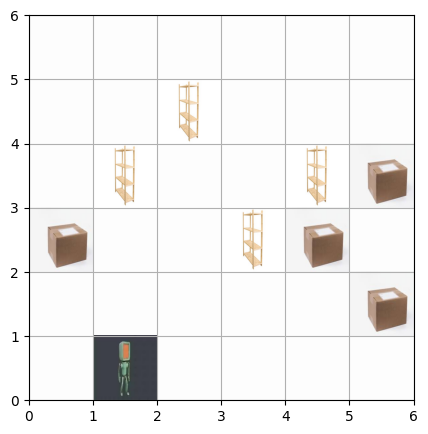

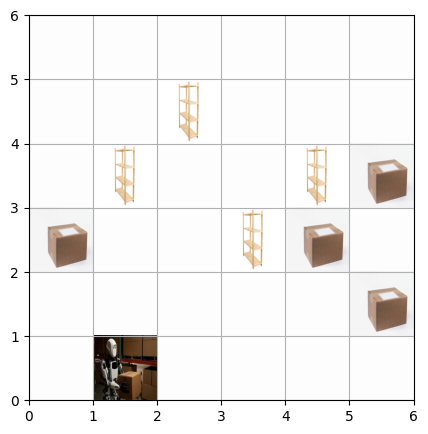

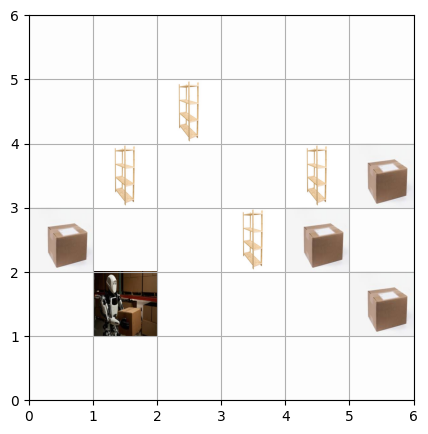

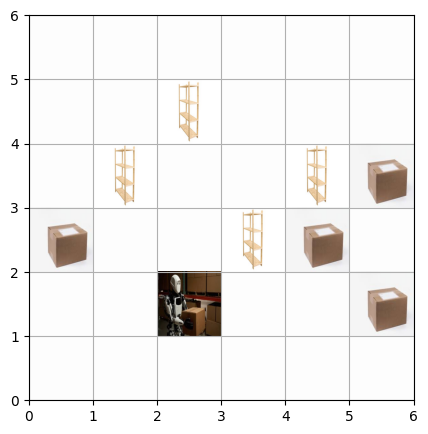

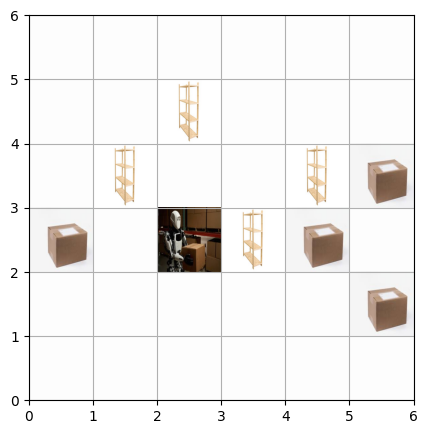

...

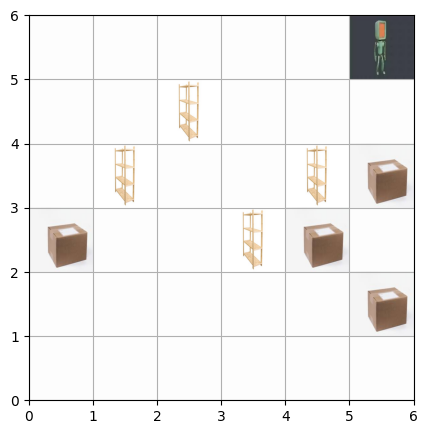

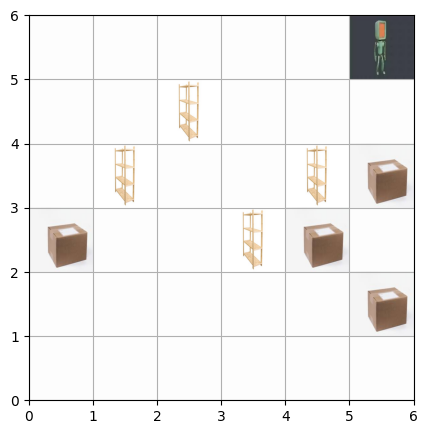

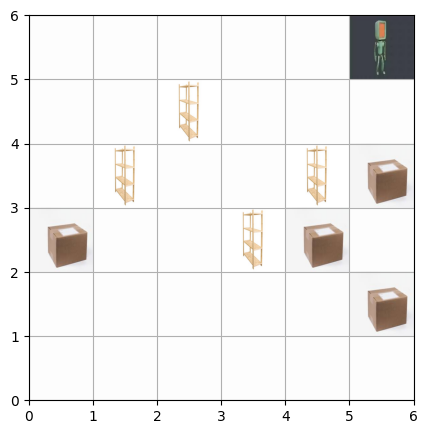

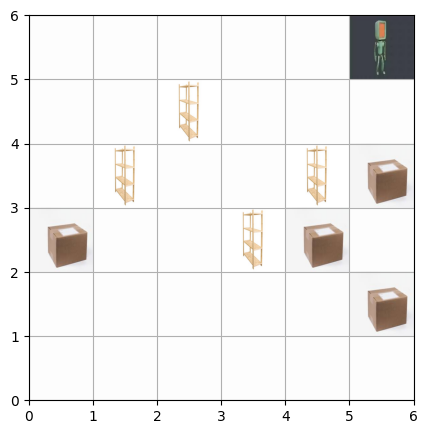

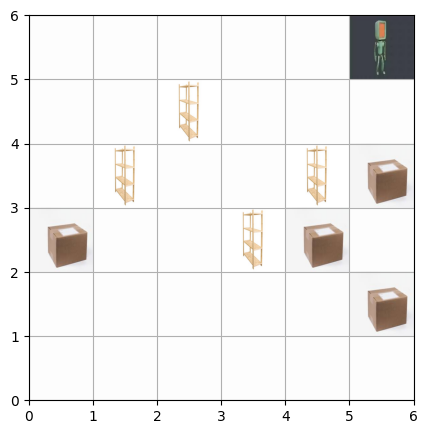

KeyboardInterrupt: 

In [13]:
def test_agent(number_episodes=10):
    rewards_per_episode = []
    
    for episode_number in range(number_episodes):
        state, _ = environment.reset()
        state = tuple(state)
        reward_total = 0
        done = False
        
        while not done:
            action = np.argmax(Q_table[state])
            next_state, reward, done, _, _ = environment.step(action)
            next_state = tuple(next_state)
            reward_total += reward
            environment.render()
            state = next_state
            if done:
                print(f"Episode {episode_number + 1}: Task completed and Total Reward is {reward_total}")
                break
        rewards_per_episode.append(reward_total)
    
    plt.figure()
    plt.plot(rewards_per_episode)
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.title('Reward for Greedy Policy')
    plt.show()
    return rewards_per_episode

test_rewards_q_learning = test_agent()